## Importing libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import \
    (ListedColormap as LCM, LinearSegmentedColormap as LSCM, Normalize)
from matplotlib.cm import ScalarMappable

import seaborn as sns
import plotly.express as px
import geopandas as gpd

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
sns.set_style("white")

---
## Contexts

In [4]:
contexts = ['notebook', 'talk', 'poster']
titlel = ['Screen Display', 'Presentation', 'Poster Print']

---
## Color Palettes

In [5]:
continuous_cmap = sns.color_palette('mako_r')
oneseq_cmap = sns.color_palette('Blues_r')
biplolarseq_cmap = sns.color_palette('coolwarm')
custom_colors = ['orangered', 'darkorange', 'yellowgreen', 'springgreen', 'teal',
                 'dodgerblue', 'mediumslateblue', 'orchid', 'lightpink']
custom_color_map = sns.color_palette(custom_colors[::-1])

In [6]:
colormaps = [continuous_cmap, oneseq_cmap, biplolarseq_cmap, custom_color_map]
colorcombo_names = ['Continuous', 'One Color Sequential', 'Bipolar Sequential', 'Custom']

---
### Items dataset

In [7]:
items_df = pd.read_csv('datasets/olist_order_items_dataset.csv')
items_df.dropna(axis=0, inplace=True)
items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [8]:
items_df.nunique()

order_id               98666
order_item_id             21
product_id             32951
seller_id               3095
shipping_limit_date    93318
price                   5968
freight_value           6999
dtype: int64

In [9]:
items_df = items_df.groupby('product_id').filter(lambda x: len(x)>50)
items_df.reset_index(inplace=True, drop=True)
items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18471 entries, 0 to 18470
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   order_id             18471 non-null  object 
 1   order_item_id        18471 non-null  int64  
 2   product_id           18471 non-null  object 
 3   seller_id            18471 non-null  object 
 4   shipping_limit_date  18471 non-null  object 
 5   price                18471 non-null  float64
 6   freight_value        18471 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 1010.3+ KB


In [10]:
items_df = items_df[['order_id', 'product_id']]
items_df

,order_id,product_id
0,00061f2a7bc09da83e415a52dc8a4af1,d63c1011f49d98b976c352955b1c4bea
1,0006ec9db01a64e59a68b2c340bf65a7,99a4788cb24856965c36a24e339b6058
2,0008288aa423d2a3f00fcb17cd7d8719,368c6c730842d78016ad823897a372db
3,0008288aa423d2a3f00fcb17cd7d8719,368c6c730842d78016ad823897a372db
4,00130c0eee84a3d909e75bc08c5c3ca1,89321f94e35fc6d7903d36f74e351d40
...,...,...
18466,fff90cdcb3b2e6cfb397d05d562fd3fe,764292b2b0f73f77a0272be03fdd45f3
18467,fffb9224b6fc7c43ebb0904318b10b5f,43423cdffde7fda63d0414ed38c11a73
18468,fffb9224b6fc7c43ebb0904318b10b5f,43423cdffde7fda63d0414ed38c11a73
18469,fffb9224b6fc7c43ebb0904318b10b5f,43423cdffde7fda63d0414ed38c11a73


---
### Orders Dataset

In [11]:
orders_df = pd.read_csv('datasets/olist_orders_dataset.csv')
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [12]:
orders_df = orders_df[['order_id', 'order_purchase_timestamp']]
orders_df.dropna(axis=0, inplace=True)
orders_df.reset_index(drop=True, inplace=True)
orders_df

,order_id,order_purchase_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33
1,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37
2,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49
3,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06
4,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39
...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,2017-03-09 09:54:05
99437,63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 12:58:58
99438,83c1379a015df1e13d02aae0204711ab,2017-08-27 14:46:43
99439,11c177c8e97725db2631073c19f07b62,2018-01-08 21:28:27


---
### Products Dataset

In [13]:
products_df = pd.read_csv('datasets/olist_products_dataset.csv')
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [14]:
products_df = products_df[['product_id', 'product_category_name']]
products_df.dropna(axis=0, inplace=True)
products_df.reset_index(drop=True, inplace=True)
products_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32341 entries, 0 to 32340
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   product_id             32341 non-null  object
 1   product_category_name  32341 non-null  object
dtypes: object(2)
memory usage: 505.5+ KB


In [15]:
products_df.head()

,product_id,product_category_name
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria
1,3aa071139cb16b67ca9e5dea641aaa2f,artes
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer
3,cef67bcfe19066a932b7673e239eb23d,bebes
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas


---
### Product Category Translation Dataset

In [16]:
prodcattrans_df = pd.read_csv('datasets/product_category_name_translation.csv')
prodcattrans_df.dropna(axis=0, inplace=True)
prodcattrans_df.reset_index(drop=True, inplace=True)
prodcattrans_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


---
## Joining datasets

In [17]:
temp1 = pd.merge(items_df, orders_df, on='order_id', how='inner')
print(temp1.info())
temp1.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18471 entries, 0 to 18470
Data columns (total 3 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   order_id                  18471 non-null  object
 1   product_id                18471 non-null  object
 2   order_purchase_timestamp  18471 non-null  object
dtypes: object(3)
memory usage: 433.0+ KB
None


,order_id,product_id,order_purchase_timestamp
0,00061f2a7bc09da83e415a52dc8a4af1,d63c1011f49d98b976c352955b1c4bea,2018-03-24 22:16:10
1,0006ec9db01a64e59a68b2c340bf65a7,99a4788cb24856965c36a24e339b6058,2018-07-24 17:04:17
2,0008288aa423d2a3f00fcb17cd7d8719,368c6c730842d78016ad823897a372db,2018-02-13 22:10:21
3,0008288aa423d2a3f00fcb17cd7d8719,368c6c730842d78016ad823897a372db,2018-02-13 22:10:21
4,00130c0eee84a3d909e75bc08c5c3ca1,89321f94e35fc6d7903d36f74e351d40,2018-06-11 21:17:00


In [18]:
temp2 = pd.merge(products_df, prodcattrans_df, on='product_category_name', how='inner')
print(temp2.info())
temp2.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32328 entries, 0 to 32327
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_id                     32328 non-null  object
 1   product_category_name          32328 non-null  object
 2   product_category_name_english  32328 non-null  object
dtypes: object(3)
memory usage: 757.8+ KB
None


,product_id,product_category_name,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,perfumery
1,6a2fb4dd53d2cdb88e0432f1284a004c,perfumaria,perfumery
2,0d009643171aee696f4733340bc2fdd0,perfumaria,perfumery
3,b1eae565a61935e0011ee7682fef9dc9,perfumaria,perfumery
4,8da90b37f0fb171b4877c124f965b1f6,perfumaria,perfumery


In [19]:
temp2.drop('product_category_name', axis=1, inplace=True)

In [20]:
temp2.head()

,product_id,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery
1,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery
2,0d009643171aee696f4733340bc2fdd0,perfumery
3,b1eae565a61935e0011ee7682fef9dc9,perfumery
4,8da90b37f0fb171b4877c124f965b1f6,perfumery


In [21]:
temp = pd.merge(temp1, temp2, on='product_id', how='inner')
print(temp.info())
temp.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18274 entries, 0 to 18273
Data columns (total 4 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       18274 non-null  object
 1   product_id                     18274 non-null  object
 2   order_purchase_timestamp       18274 non-null  object
 3   product_category_name_english  18274 non-null  object
dtypes: object(4)
memory usage: 571.2+ KB
None


,order_id,product_id,order_purchase_timestamp,product_category_name_english
0,00061f2a7bc09da83e415a52dc8a4af1,d63c1011f49d98b976c352955b1c4bea,2018-03-24 22:16:10,health_beauty
1,0210336762a2618a562576d1266efefe,d63c1011f49d98b976c352955b1c4bea,2018-04-16 18:07:08,health_beauty
2,0224d4ce99f4262f9554d248dfad743c,d63c1011f49d98b976c352955b1c4bea,2018-03-17 19:25:07,health_beauty
3,09268d8b25dd31ae78b464efd453d069,d63c1011f49d98b976c352955b1c4bea,2018-06-08 21:53:39,health_beauty
4,0b4ed5311f55b9b8f0f30b35e5b45dbd,d63c1011f49d98b976c352955b1c4bea,2018-05-30 22:55:26,health_beauty


In [22]:
temp.order_purchase_timestamp = pd.to_datetime(temp.order_purchase_timestamp)
temp.head()

,order_id,product_id,order_purchase_timestamp,product_category_name_english
0,00061f2a7bc09da83e415a52dc8a4af1,d63c1011f49d98b976c352955b1c4bea,2018-03-24 22:16:10,health_beauty
1,0210336762a2618a562576d1266efefe,d63c1011f49d98b976c352955b1c4bea,2018-04-16 18:07:08,health_beauty
2,0224d4ce99f4262f9554d248dfad743c,d63c1011f49d98b976c352955b1c4bea,2018-03-17 19:25:07,health_beauty
3,09268d8b25dd31ae78b464efd453d069,d63c1011f49d98b976c352955b1c4bea,2018-06-08 21:53:39,health_beauty
4,0b4ed5311f55b9b8f0f30b35e5b45dbd,d63c1011f49d98b976c352955b1c4bea,2018-05-30 22:55:26,health_beauty


In [23]:
temp['timestamp'] = temp.order_purchase_timestamp.dt.date
temp.timestamp = pd.to_datetime(temp.timestamp)
# temp.timestamp = temp.timestamp.dt.strftime('%m-%Y')
temp.head()

,order_id,product_id,order_purchase_timestamp,product_category_name_english,timestamp
0,00061f2a7bc09da83e415a52dc8a4af1,d63c1011f49d98b976c352955b1c4bea,2018-03-24 22:16:10,health_beauty,2018-03-24
1,0210336762a2618a562576d1266efefe,d63c1011f49d98b976c352955b1c4bea,2018-04-16 18:07:08,health_beauty,2018-04-16
2,0224d4ce99f4262f9554d248dfad743c,d63c1011f49d98b976c352955b1c4bea,2018-03-17 19:25:07,health_beauty,2018-03-17
3,09268d8b25dd31ae78b464efd453d069,d63c1011f49d98b976c352955b1c4bea,2018-06-08 21:53:39,health_beauty,2018-06-08
4,0b4ed5311f55b9b8f0f30b35e5b45dbd,d63c1011f49d98b976c352955b1c4bea,2018-05-30 22:55:26,health_beauty,2018-05-30


In [24]:
try:
    temp.drop('order_purchase_timestamp', axis=1, inplace=True)
except Exception as e:
    print(e)

temp.head()

,order_id,product_id,product_category_name_english,timestamp
0,00061f2a7bc09da83e415a52dc8a4af1,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-03-24
1,0210336762a2618a562576d1266efefe,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-04-16
2,0224d4ce99f4262f9554d248dfad743c,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-03-17
3,09268d8b25dd31ae78b464efd453d069,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-06-08
4,0b4ed5311f55b9b8f0f30b35e5b45dbd,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-05-30


---
# Monthly changes in different product sold
---

In [25]:
temp['year'] = temp.timestamp.dt.year
temp['month'] = temp.timestamp.dt.month
temp.head()

,order_id,product_id,product_category_name_english,timestamp,year,month
0,00061f2a7bc09da83e415a52dc8a4af1,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-03-24,2018,3
1,0210336762a2618a562576d1266efefe,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-04-16,2018,4
2,0224d4ce99f4262f9554d248dfad743c,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-03-17,2018,3
3,09268d8b25dd31ae78b464efd453d069,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-06-08,2018,6
4,0b4ed5311f55b9b8f0f30b35e5b45dbd,d63c1011f49d98b976c352955b1c4bea,health_beauty,2018-05-30,2018,5


In [26]:
temp['monthyear'] = temp.timestamp.dt.strftime('%Y-%m')

In [27]:
cattemp = temp.groupby(['product_category_name_english', 'monthyear']).size().reset_index(name='product_count')
cattemp.columns = ['product category', 'timestamp', 'sell count']
cattemp

,product category,timestamp,sell count
0,art,2018-01,13
1,art,2018-02,9
2,art,2018-03,2
3,art,2018-04,15
4,art,2018-05,21
...,...,...,...
440,watches_gifts,2018-04,237
441,watches_gifts,2018-05,327
442,watches_gifts,2018-06,144
443,watches_gifts,2018-07,144


In [28]:
cattemp['timestamp'].unique()

array(['2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06',
       '2018-07', '2018-08', '2017-01', '2017-02', '2017-03', '2017-04',
       '2017-05', '2017-06', '2017-07', '2017-08', '2017-09', '2017-10',
       '2017-11', '2017-12', '2016-10'], dtype=object)

In [29]:
cattemp.nunique()

product category     26
timestamp            21
sell count          122
dtype: int64

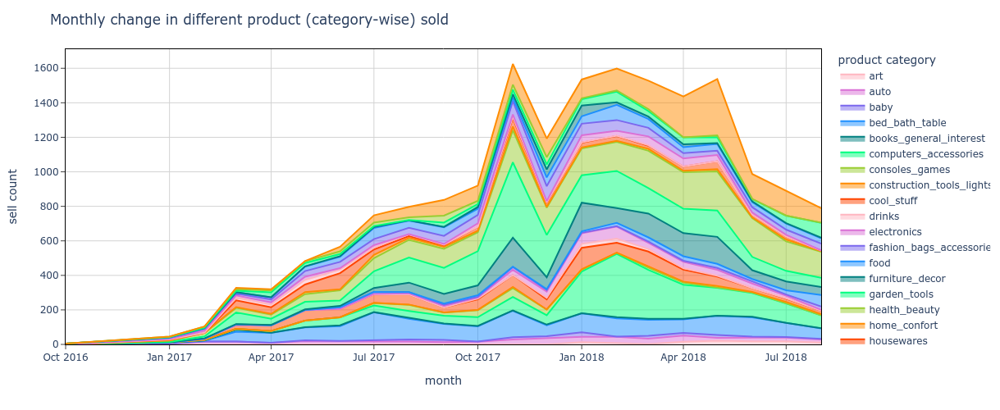

In [30]:
fig = px.area(cattemp, x='timestamp', y='sell count', color='product category',
              color_discrete_sequence=custom_colors[::-1], width=1000, height=500)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_layout(
    plot_bgcolor='white',
    yaxis_title='sell count',
    xaxis_title='month',
    title={'text': 'Monthly change in different product (category-wise) sold'},
    showlegend=True
)
fig.show()

In [31]:
cattemp.sort_values(by='timestamp', inplace=True)
cattemp.reset_index(inplace=True, drop=True)
cattemp.head()

,product category,timestamp,sell count
0,perfumery,2016-10,5
1,office_furniture,2017-01,4
2,toys,2017-01,3
3,telephony,2017-01,1
4,perfumery,2017-01,5


In [32]:
categories = sorted(cattemp['product category'].unique())
timestamps = sorted(cattemp['timestamp'].unique())

mini, maxi = cattemp['sell count'].min(), cattemp['sell count'].max()

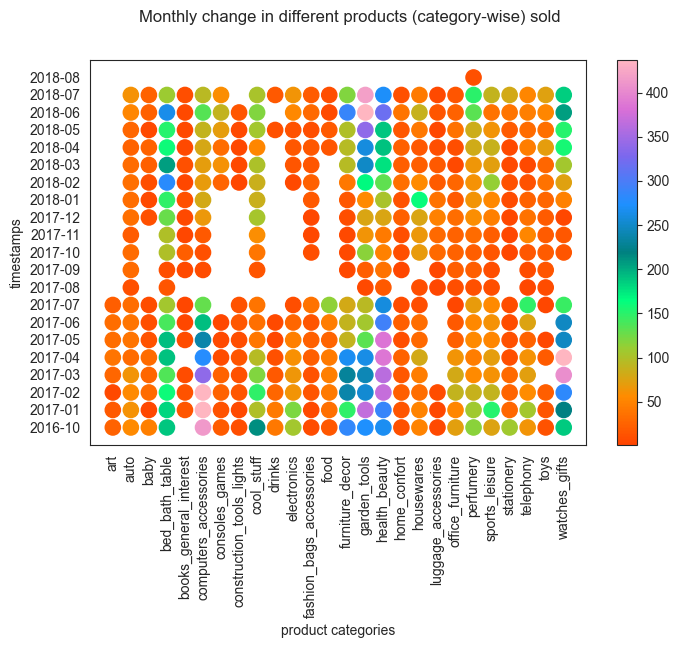

In [33]:
fig, ax = plt.subplots(figsize=(8,5))
_cmap = LSCM.from_list("colormap", custom_color_map[::-1], N=256)

for idx, cat in enumerate(categories):
    d = cattemp[cattemp["product category"] == cat]
    y = d["timestamp"]
    x = [idx] * len(y)
    _color = _cmap(d["sell count"])
    ax.scatter(x, y, color=_color, s=120)

ax.set_xticks(range(len(categories)), categories, rotation=90)
ax.set_yticks(range(len(timestamps)), timestamps)
ax.set_xlabel('product categories')
ax.set_ylabel('timestamps')

cmappable = ScalarMappable(norm=Normalize(mini,maxi), cmap=_cmap)
fig.colorbar(cmappable, ax=ax)
fig.suptitle('Monthly change in different products (category-wise) sold', x=0.45)
plt.show()

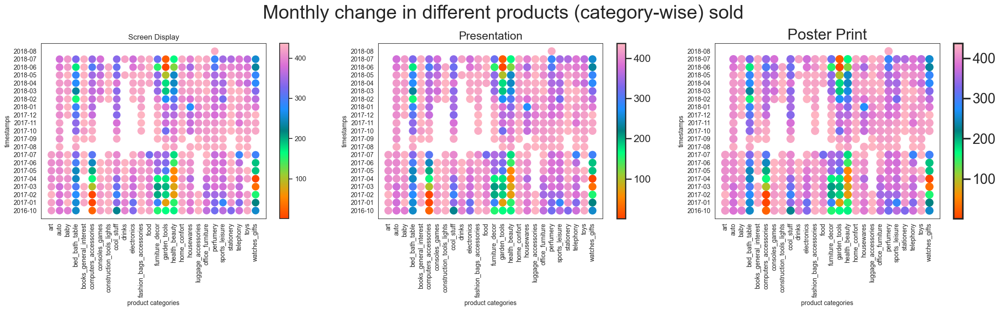

In [34]:
fig, ax = plt.subplots(1, 3, figsize=(27,5))
_cmap = LSCM.from_list("colormap", custom_color_map[::], N=256)

for each in range(len(contexts)):
    sns.set_context(contexts[each])
    for idx, cat in enumerate(categories):
        d = cattemp[cattemp["product category"] == cat]
        y = d["timestamp"]
        x = [idx] * len(y)
        _color = _cmap(d["sell count"])
        ax[each].scatter(x, y, color=_color, s=120)

    ax[each].set_xticks(range(len(categories)), categories, rotation=90)
    ax[each].set_yticks(range(len(timestamps)), timestamps)
    ax[each].set_xlabel('product categories')
    ax[each].set_ylabel('timestamps')
    ax[each].set_title(f'{titlel[each]}')
    fig.colorbar(cmappable, ax=ax[each])

fig.suptitle('Monthly change in different products (category-wise) sold', fontsize=30, y=1.05)
plt.show()
sns.set_context('notebook')

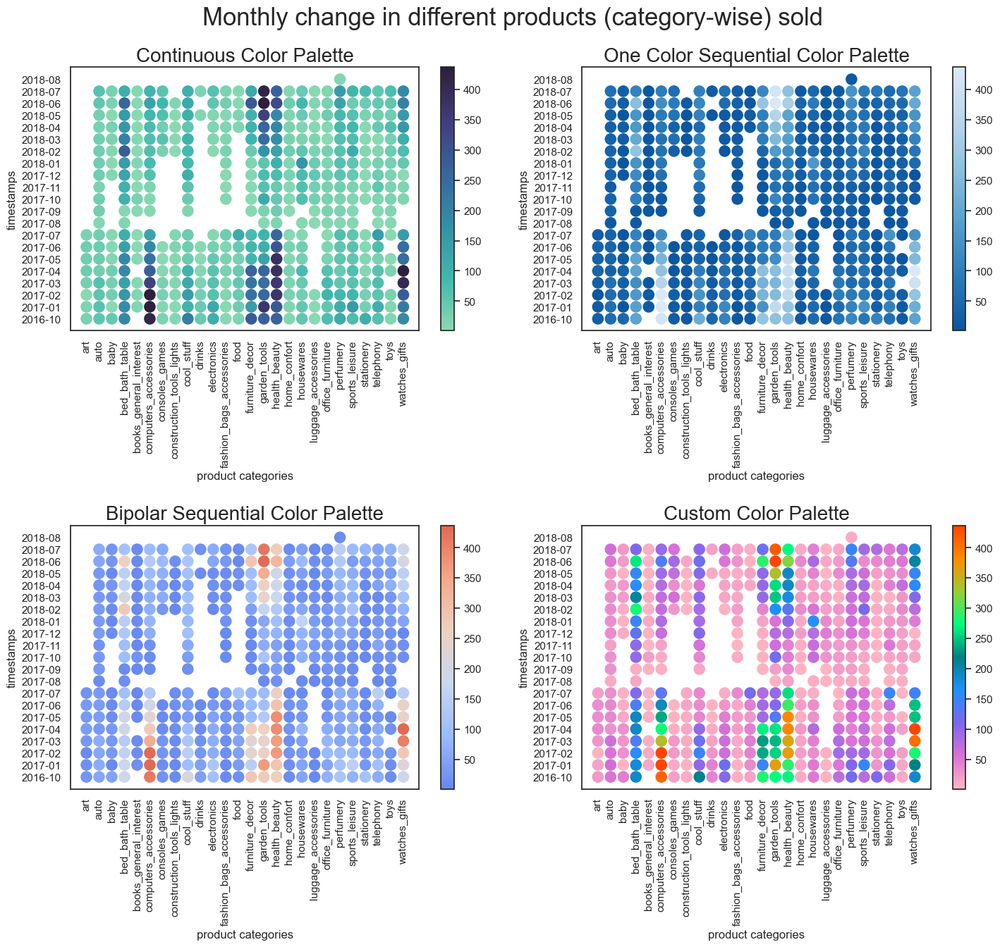

In [35]:
fig, ax = plt.subplots(2, 2, figsize=(15,14))

for each in range(len(colorcombo_names)):
    _cmap = LSCM.from_list("colormap", colormaps[each], N=256)
    for idx, cat in enumerate(categories):
        d = cattemp[cattemp["product category"] == cat]
        y = d["timestamp"]
        x = [idx] * len(y)
        _color = _cmap(d["sell count"])
        ax[each//2][each%2].scatter(x, y, color=_color, s=120)

    ax[each//2][each%2].set_xticks(range(len(categories)), categories, rotation=90)
    ax[each//2][each%2].set_yticks(range(len(timestamps)), timestamps)
    ax[each//2][each%2].set_xlabel('product categories')
    ax[each//2][each%2].set_ylabel('timestamps')
    ax[each//2][each%2].set_title(f'{colorcombo_names[each]} Color Palette', fontsize=20)
    cmappable = ScalarMappable(norm=Normalize(mini,maxi), cmap=_cmap)
    fig.colorbar(cmappable, ax=ax[each//2][each%2])

mini, maxi = cattemp['sell count'].min(), cattemp['sell count'].max()
fig.suptitle('Monthly change in different products (category-wise) sold', fontsize=25, y=0.97)
fig.tight_layout(pad=2)
plt.show()

---
# Statewise distibution of total revenue
---

In [36]:
items_df = pd.read_csv('datasets/olist_order_items_dataset.csv')
print(items_df.info())
items_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB
None


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [37]:
items_df = items_df[['seller_id', 'price']]
items_df

,seller_id,price
0,48436dade18ac8b2bce089ec2a041202,58.90
1,dd7ddc04e1b6c2c614352b383efe2d36,239.90
2,5b51032eddd242adc84c38acab88f23d,199.00
3,9d7a1d34a5052409006425275ba1c2b4,12.99
4,df560393f3a51e74553ab94004ba5c87,199.90
...,...,...
112645,b8bc237ba3788b23da09c0f1f3a3288c,299.99
112646,f3c38ab652836d21de61fb8314b69182,350.00
112647,c3cfdc648177fdbbbb35635a37472c53,99.90
112648,2b3e4a2a3ea8e01938cabda2a3e5cc79,55.99


In [38]:
sellers_df = pd.read_csv('datasets/olist_sellers_dataset.csv')
sellers_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [39]:
sellers_df = sellers_df[['seller_id', 'seller_state']]
sellers_df.dropna(axis=0, inplace=True)
sellers_df.head()

,seller_id,seller_state
0,3442f8959a84dea7ee197c632cb2df15,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,SP


In [40]:
state_revenue = pd.merge(items_df, sellers_df, on='seller_id', how='inner')
state_revenue.drop('seller_id', axis=1, inplace=True)
state_revenue.reset_index(drop=True, inplace=True)
state_revenue.columns = ['revenue', 'state']
state_revenue.head()

,revenue,state
0,58.9,SP
1,55.9,SP
2,132.9,SP
3,58.9,SP
4,139.9,SP


In [41]:
state_revenue = state_revenue.groupby(['state']).sum()
state_revenue.sort_values(by='revenue', inplace=True, ascending=False)

In [42]:
state_revenue.head()

,revenue
state,
SP,8753396.21
PR,1261887.21
MG,1011564.74
RJ,843984.22
SC,632426.07


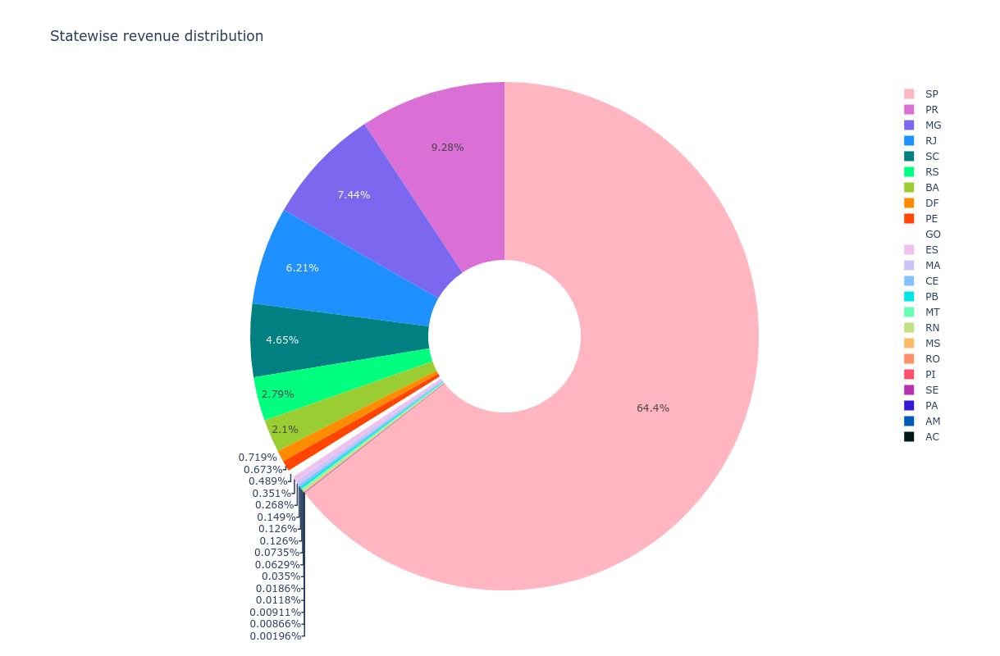

In [43]:
fig = px.pie(state_revenue, values='revenue', names=state_revenue.index, title='Statewise revenue distribution', width=1000, height=800, hole=0.3,
             color_discrete_sequence=custom_colors[::-1])
fig.show()

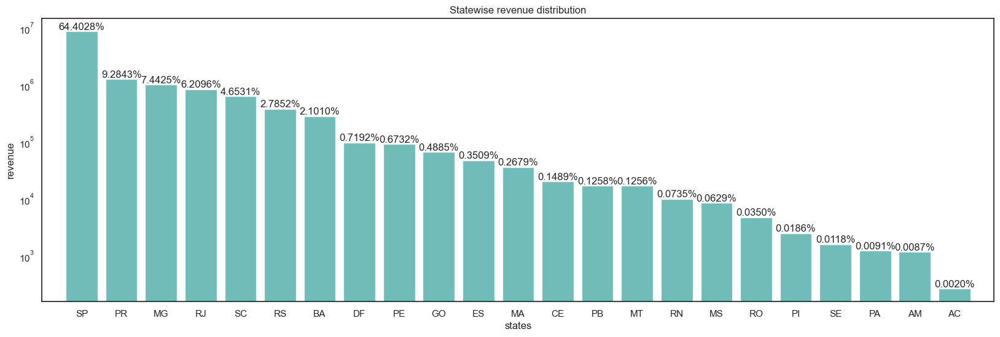

In [44]:
plt.figure(figsize=(20,6))
ax = sns.barplot(x=state_revenue.index, y=state_revenue.revenue, color='lightseagreen', alpha=0.7)
patches = ax.patches
percentage = state_revenue.revenue/state_revenue.revenue.sum()*100
for each in range(len(patches)):
    x = patches[each].get_x() + patches[each].get_width()/2
    y = 1.07*patches[each].get_height() 
    ax.annotate('{:.4f}%'.format(percentage[each]), (x,y), ha='center')
    
plt.yscale('log')
plt.xlim(-1, len(state_revenue))
plt.xlabel('states')
plt.ylabel('revenue')
plt.title('Statewise revenue distribution')
plt.show()

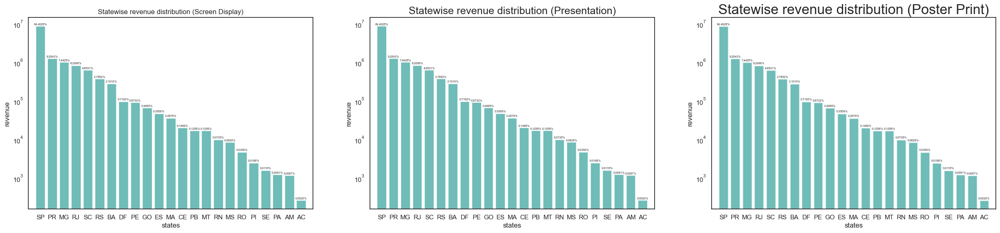

In [45]:
fig, ax = plt.subplots(1,3, figsize=(30, 6))

for idx, context in enumerate(contexts):
    sns.set_context(context)
    axt = sns.barplot(x=state_revenue.index, y=state_revenue.revenue, color='lightseagreen', alpha=0.7, ax=ax[idx])
    patches = axt.patches
    percentage = state_revenue.revenue/state_revenue.revenue.sum()*100
    for each in range(len(patches)):
        x = patches[each].get_x() + patches[each].get_width()/2
        y = 1.07*patches[each].get_height() 
        axt.annotate('{:.4f}%'.format(percentage[each]), (x,y), ha='center', fontsize=5)

    ax[idx].set_yscale('log')
    ax[idx].set_xlim(-1, len(state_revenue))
    ax[idx].set_xlabel('states')
    ax[idx].set_ylabel('revenue')
    ax[idx].set_title(f'Statewise revenue distribution ({titlel[idx]})')
    
plt.show()
sns.set_context('notebook')

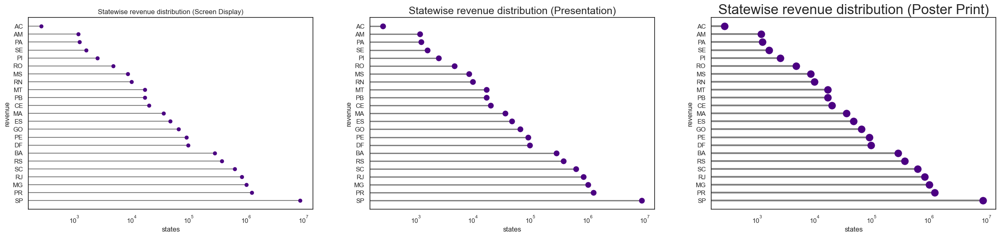

In [46]:
fig, ax = plt.subplots(1,3, figsize=(30, 6))
Range = range(1, len(state_revenue.index)+1)

for idx, context in enumerate(contexts):
    sns.set_context(context)
    ax[idx].hlines(y=Range, xmin=0, xmax=state_revenue['revenue'], color='grey')
    ax[idx].plot(state_revenue['revenue'], Range, "o", color='indigo')
    ax[idx].set_xscale('log')
    ax[idx].set_xlabel('states')
    ax[idx].set_ylabel('revenue')
    ax[idx].set_yticks(Range, state_revenue.index)
    ax[idx].set_title(f'Statewise revenue distribution ({titlel[idx]})')
    
plt.show()
sns.set_context('notebook')

In [47]:
geoloc_df = pd.read_csv('datasets/olist_geolocation_dataset.csv')
print(geoloc_df.info())
geoloc_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB
None


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [48]:
geoloc_df.drop(['geolocation_zip_code_prefix', 'geolocation_city'], axis=1, inplace=True)
geoloc_df.columns = ['lat', 'long', 'state']
geoloc_df.head()

,lat,long,state
0,-23.545621,-46.639292,SP
1,-23.546081,-46.644820,SP
2,-23.546129,-46.642951,SP
3,-23.544392,-46.639499,SP
4,-23.541578,-46.641607,SP


In [49]:
brazil = gpd.read_file('brazil.json')

In [50]:
brazil.head()

,id,name,geometry
0,AC,Acre,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350..."
1,AL,Alagoas,"MULTIPOLYGON (((-35.90153 -9.86181, -35.90153 ..."
2,AP,Amapá,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0..."
3,AM,Amazonas,"MULTIPOLYGON (((-53.62548 -26.88481, -53.61900..."
4,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708..."


In [51]:
try:
    brazil.drop('name', axis=1, inplace=True)
except Exception as e:
    print(e)
brazil.columns = ['state', 'geometry']

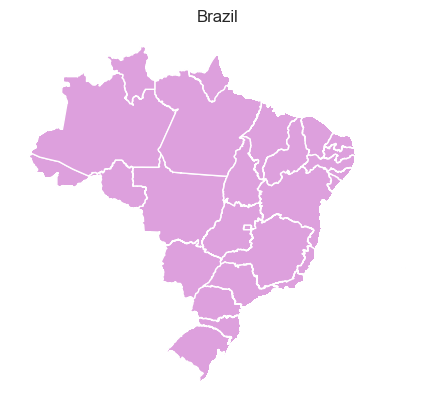

In [52]:
brazil.plot(color='plum', edgecolor='w')
plt.axis('off')
plt.title('Brazil')
plt.show()

In [53]:
brazil.head()

,state,geometry
0,AC,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350..."
1,AL,"MULTIPOLYGON (((-35.90153 -9.86181, -35.90153 ..."
2,AP,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0..."
3,AM,"MULTIPOLYGON (((-53.62548 -26.88481, -53.61900..."
4,BA,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708..."


In [54]:
temp = geoloc_df.groupby(['state']).mean()
temp.head()

,lat,long
state,,
AC,-9.702555,-68.451852
AL,-9.599729,-36.052017
AM,-3.349336,-60.537430
AP,0.086025,-51.234304
BA,-13.049361,-39.560649


In [55]:
len(state_revenue), len(temp)

(23, 27)

In [56]:
merged_state = pd.merge(state_revenue.reset_index(), temp.reset_index(), on='state', how='right')
merged_state.head()

,state,revenue,lat,long
0,AC,267.00,-9.702555,-68.451852
1,AL,NaN,-9.599729,-36.052017
2,AM,1177.00,-3.349336,-60.537430
3,AP,NaN,0.086025,-51.234304
4,BA,285561.56,-13.049361,-39.560649


In [57]:
gdf = gpd.GeoDataFrame(merged_state)
gdf.head()

,state,revenue,lat,long
0,AC,267.00,-9.702555,-68.451852
1,AL,NaN,-9.599729,-36.052017
2,AM,1177.00,-3.349336,-60.537430
3,AP,NaN,0.086025,-51.234304
4,BA,285561.56,-13.049361,-39.560649


In [58]:
brazil_revenue = brazil.merge(gdf, on='state', how='left')
brazil_revenue.fillna(0, inplace=True)

In [59]:
brazil_revenue.head()

,state,geometry,revenue,lat,long
0,AC,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350...",267.00,-9.702555,-68.451852
1,AL,"MULTIPOLYGON (((-35.90153 -9.86181, -35.90153 ...",0.00,-9.599729,-36.052017
2,AP,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0...",0.00,0.086025,-51.234304
3,AM,"MULTIPOLYGON (((-53.62548 -26.88481, -53.61900...",1177.00,-3.349336,-60.537430
4,BA,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708...",285561.56,-13.049361,-39.560649


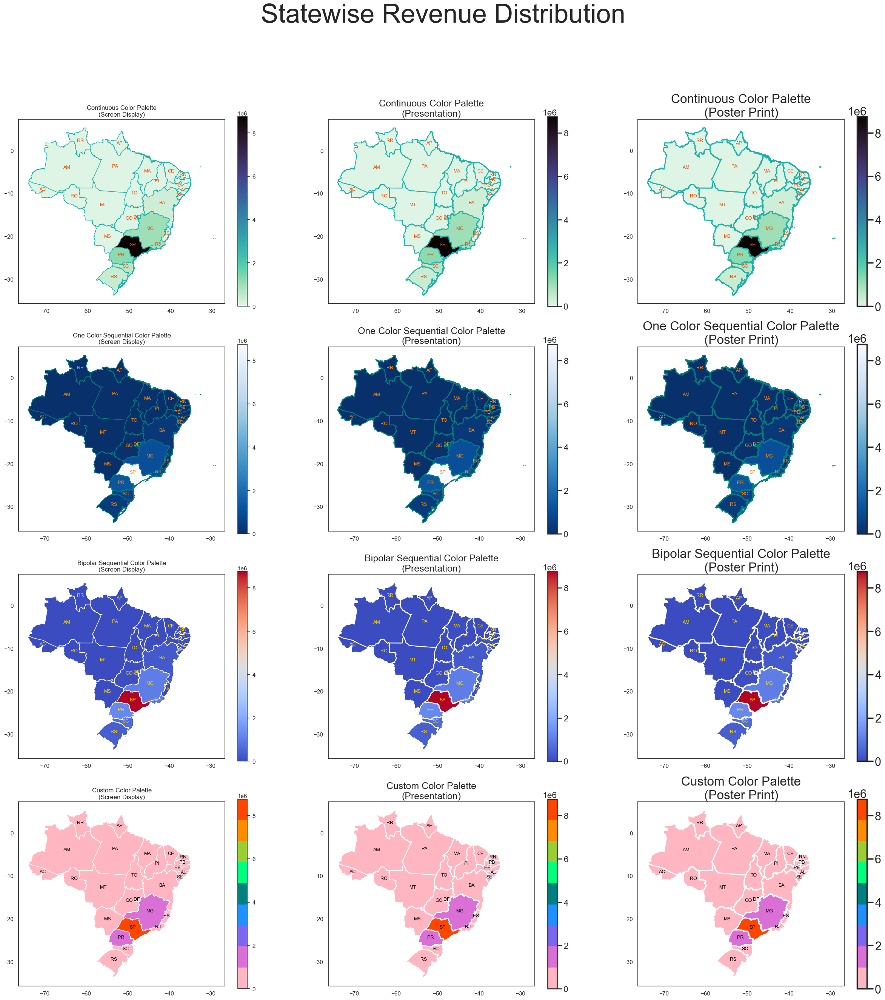

In [60]:
sns.set_context('notebook')
fig, ax = plt.subplots(4, 3, figsize=(30,30))
colorcombos = [('mako_r', 'lightseagreen', 'orangered'),
         ('Blues_r', 'teal', 'darkorange'),
         ('coolwarm', 'white', 'gold'),
         (LCM(custom_color_map), 'white', 'black')
]

fig.suptitle('Statewise Revenue Distribution', fontsize=50)

for i in range(len(colorcombos)):
    for j in range(len(contexts)):
        sns.set_context(contexts[j])
        _cmap, _edgecolor, _color = colorcombos[i]
        brazil_revenue.plot(ax=ax[i][j], column='revenue', cmap=_cmap, edgecolor=_edgecolor, legend=True)
        brazil_revenue.apply(lambda x: ax[i][j].annotate(text=x['state'], xy=x.geometry.centroid.coords[0], ha='center', color=_color, fontsize=9), axis=1)
        ax[i][j].set_title(f'{colorcombo_names[i]} Color Palette\n({titlel[j]})')

plt.show()
sns.set_context('notebook')

---
# Sellers Distribution

In [61]:
sellers_df = pd.read_csv('datasets/olist_sellers_dataset.csv')
sellers_df.dropna(axis=0, inplace=True)
sellers_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [62]:
sellers_df.nunique()

seller_id                 3095
seller_zip_code_prefix    2246
seller_city                611
seller_state                23
dtype: int64

In [63]:
temp = sellers_df[['seller_city', 'seller_state']]
temp.columns = ['city', 'state']
temp = temp.value_counts().reset_index(name='count')
temp.head()

,city,state,count
0,sao paulo,SP,694
1,curitiba,PR,124
2,rio de janeiro,RJ,93
3,belo horizonte,MG,66
4,ribeirao preto,SP,52


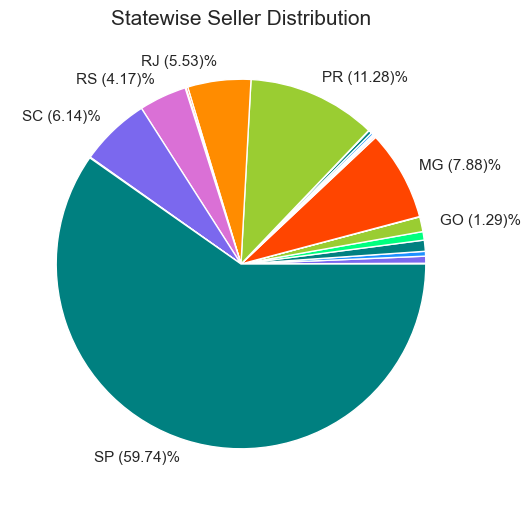

In [64]:
fig, ax = plt.subplots(figsize=(6,6))

t = temp.groupby('state').sum()
t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
labels = [f'{t.index[each]} ({t["percentage"][each]})%' if t['percentage'][each]>1 else '' for each in range(len(t))]
plt.pie(t['count'], labels=labels, colors=custom_color_map)
plt.title('Statewise Seller Distribution', fontsize=15)
plt.show()

In [65]:
states = temp['state'].unique()

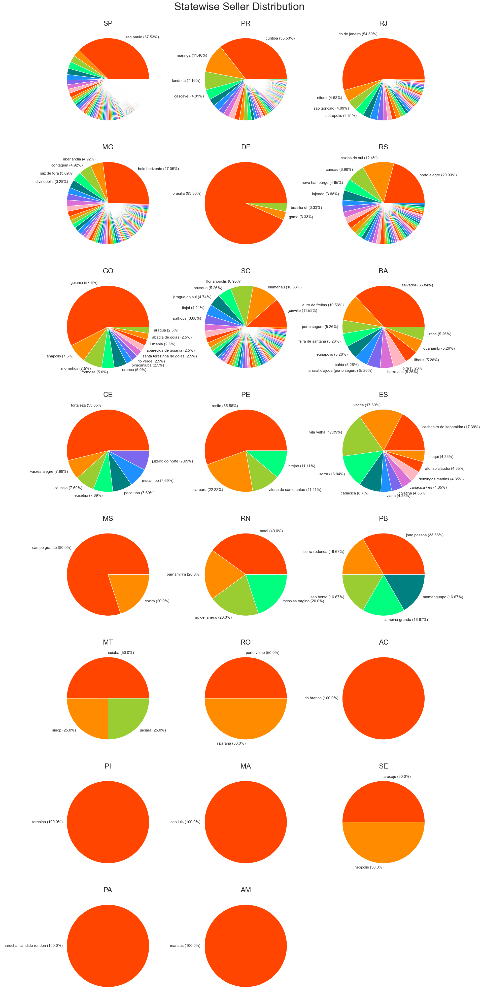

In [66]:
fig, ax = plt.subplots(8, 3, figsize=(20,50))
states = temp['state'].unique()

for idx in range(len(states)):
    t = temp[temp['state']==states[idx]].reset_index(drop=True)
    t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
    if len(t)>20:
        labels = ['' if t['percentage'][each]<=3 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    else:
        labels = ['' if t['percentage'][each]<=1 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    ax[idx//3][idx%3].pie(t['count'], labels=labels, colors=custom_color_map[::-1])
    ax[idx//3][idx%3].set_title(states[idx], fontsize=20)

plt.axis('off')
fig.suptitle('Statewise Seller Distribution', fontsize=30, y=0.9)
plt.show()

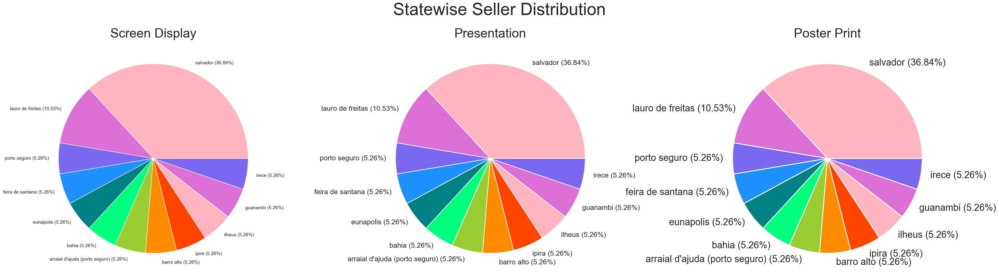

In [67]:
sns.set_context('notebook')
fig, ax = plt.subplots(1, 3, figsize=(40,10))

for idx in range(len(contexts)):
    sns.set_context(contexts[idx])
    t = temp[temp['state']=='BA'].reset_index(drop=True)
    t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
    if len(t)>20:
        labels = ['' if t['percentage'][each]<=3 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    else:
        labels = ['' if t['percentage'][each]<=1 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    ax[idx%3].pie(t['count'], labels=labels, colors=custom_color_map)
    ax[idx%3].set_title(f'{titlel[idx]}', fontsize=30)

fig.suptitle('Statewise Seller Distribution', fontsize=40, y=1, x=0.52)
plt.show()
sns.set_context('notebook')

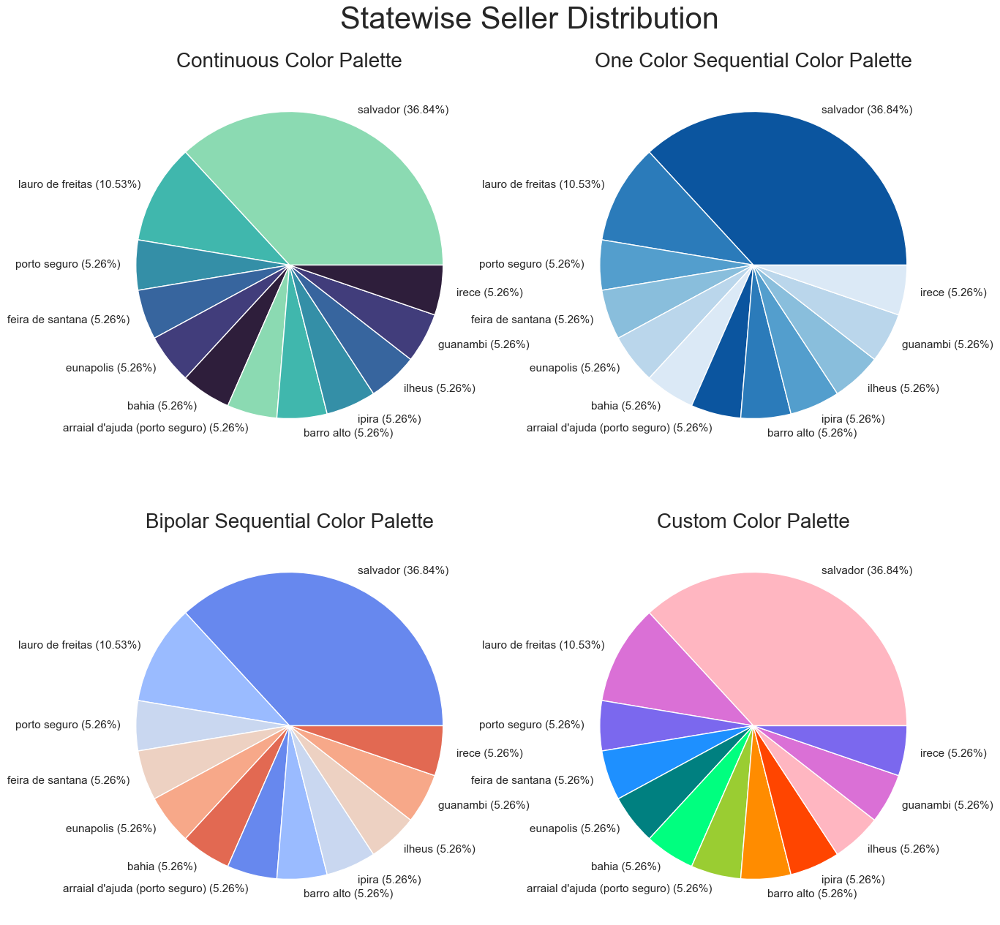

In [68]:
fig, ax = plt.subplots(2, 2, figsize=(15,15))

for idx in range(len(colormaps)):
    t = temp[temp['state']=='BA'].reset_index(drop=True)
    t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
    if len(t)>20:
        labels = ['' if t['percentage'][each]<=3 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    else:
        labels = ['' if t['percentage'][each]<=1 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    ax[idx//2][idx%2].pie(t['count'], labels=labels, colors=colormaps[idx])
    ax[idx//2][idx%2].set_title(f'{colorcombo_names[idx]} Color Palette', fontsize=20)

fig.suptitle('Statewise Seller Distribution', fontsize=30, y=0.94, x=0.52)
plt.show()

---
# Customers Distribution

In [69]:
customers_df = pd.read_csv('datasets/olist_customers_dataset.csv')
customers_df.dropna(axis=0, inplace=True)
customers_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [70]:
customers_df.nunique()

customer_id                 99441
customer_unique_id          96096
customer_zip_code_prefix    14994
customer_city                4119
customer_state                 27
dtype: int64

In [71]:
temp = customers_df[['customer_city', 'customer_state']]
temp.columns = ['city', 'state']
temp = temp.value_counts().reset_index(name='count')
temp.head()

,city,state,count
0,sao paulo,SP,15540
1,rio de janeiro,RJ,6882
2,belo horizonte,MG,2773
3,brasilia,DF,2131
4,curitiba,PR,1521


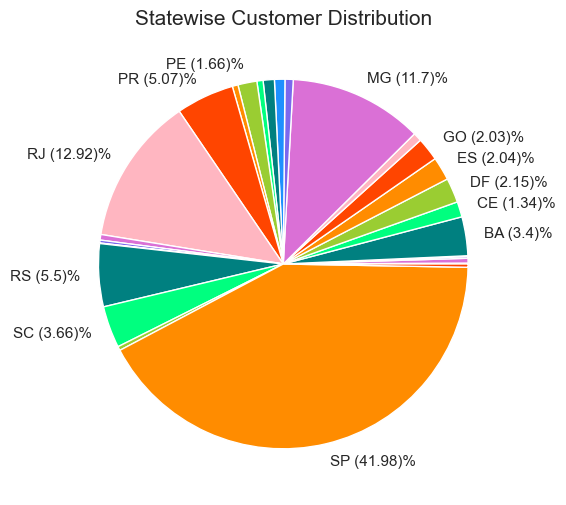

In [72]:
fig, ax = plt.subplots(figsize=(6,6))

t = temp.groupby('state').sum()
t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
labels = [f'{t.index[each]} ({t["percentage"][each]})%' if t['percentage'][each]>1 else '' for each in range(len(t))]
plt.pie(t['count'], labels=labels, colors=custom_color_map[::])
plt.title('Statewise Customer Distribution', fontsize=15)
plt.show()

In [73]:
states = temp['state'].unique()

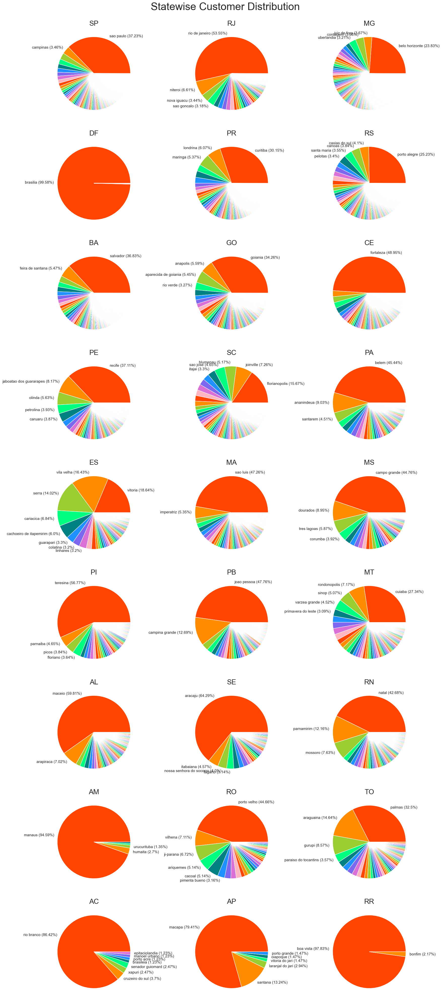

In [74]:
fig, ax = plt.subplots(9, 3, figsize=(20,50))
states = temp['state'].unique()

for idx in range(len(states)):
    t = temp[temp['state']==states[idx]].reset_index(drop=True)
    t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
    if len(t)>20:
        labels = ['' if t['percentage'][each]<=3 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    else:
        labels = ['' if t['percentage'][each]<=1 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    ax[idx//3][idx%3].pie(t['count'], labels=labels, colors=custom_color_map[::-1])
    ax[idx//3][idx%3].set_title(states[idx], fontsize=20)

fig.suptitle('Statewise Customer Distribution', fontsize=30, y=0.9)
plt.show()

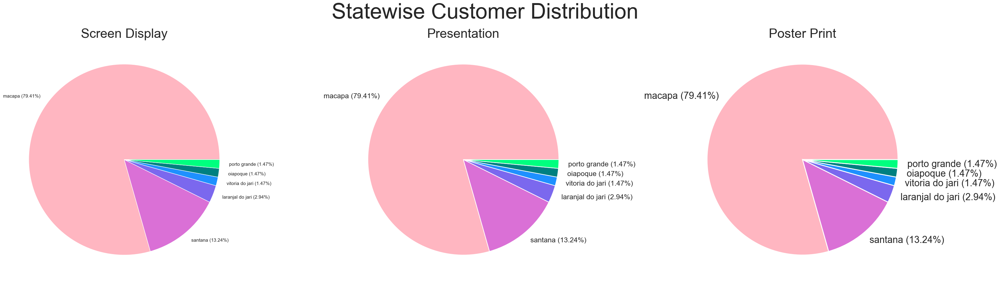

In [75]:
sns.set_context('notebook')
fig, ax = plt.subplots(1, 3, figsize=(40,10))

for idx in range(len(contexts)):
    sns.set_context(contexts[idx])
    t = temp[temp['state']=='AP'].reset_index(drop=True)
    t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
    if len(t)>20:
        labels = ['' if t['percentage'][each]<=3 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    else:
        labels = ['' if t['percentage'][each]<=1 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    ax[idx%3].pie(t['count'], labels=labels, colors=custom_color_map)
    ax[idx%3].set_title(f'{titlel[idx]}', fontsize=30)
    
fig.suptitle('Statewise Customer Distribution', fontsize=50, y=1, x=0.53)
plt.show()
sns.set_context('notebook')

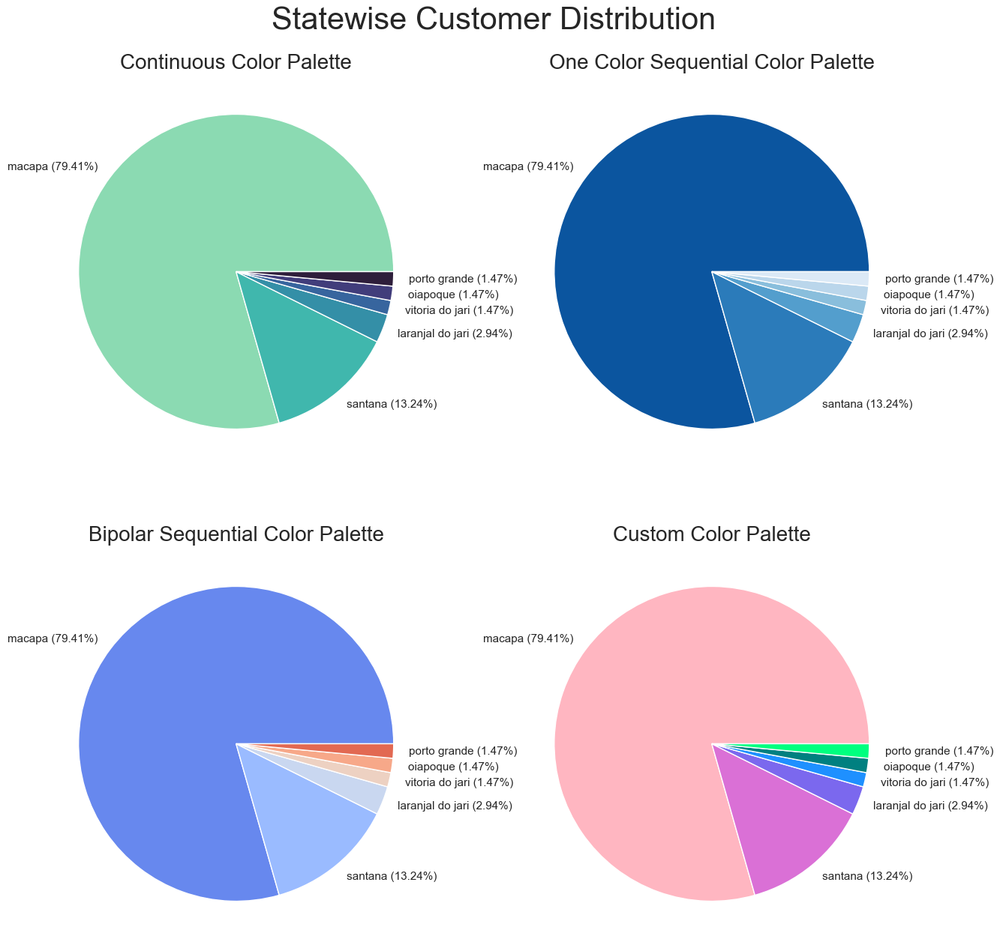

In [76]:
fig, ax = plt.subplots(2, 2, figsize=(15,15))
for idx in range(len(colormaps)):
    t = temp[temp['state']=='AP'].reset_index(drop=True)
    t['percentage'] = np.round(t['count']/t['count'].sum()*100, 2)
    if len(t)>20:
        labels = ['' if t['percentage'][each]<=3 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    else:
        labels = ['' if t['percentage'][each]<=1 else f"{t['city'][each]} ({t['percentage'][each]}%)" for each in range(len(t))]
    ax[idx//2][idx%2].pie(t['count'], labels=labels, colors=colormaps[idx])
    ax[idx//2][idx%2].set_title(f'{colorcombo_names[idx]} Color Palette', fontsize=20)

fig.suptitle('Statewise Customer Distribution', fontsize=30, y=0.94, x=0.53)
plt.show()

---
# Sellers v/s Customers Distribution

In [77]:
stemp = sellers_df[['seller_city', 'seller_state']]
stemp.columns = ['seller_city', 'state']
stemp = stemp.value_counts().reset_index(name='seller_count')
stemp = stemp.groupby('state').sum()
stemp.drop('seller_city', axis=1, inplace=True)
stemp.head()

,seller_count
state,
AC,1
AM,1
BA,19
CE,13
DF,30


In [78]:
ctemp = customers_df[['customer_city', 'customer_state']]
ctemp.columns = ['customer_city', 'state']
ctemp = ctemp.value_counts().reset_index(name='customer_count')
ctemp = ctemp.groupby('state').sum()
ctemp = ctemp.reset_index()
ctemp.drop('customer_city', axis=1, inplace=True)
ctemp.head()

,state,customer_count
0,AC,81
1,AL,413
2,AM,148
3,AP,68
4,BA,3380


In [79]:
scdf = pd.merge(stemp, ctemp, on='state', how='right')
scdf.fillna(0, inplace=True)
scdf.columns = ['State', 'Seller Count', 'Customer Count']

In [80]:
scdf.head()

,State,Seller Count,Customer Count
0,AC,1.0,81
1,AL,0.0,413
2,AM,1.0,148
3,AP,0.0,68
4,BA,19.0,3380


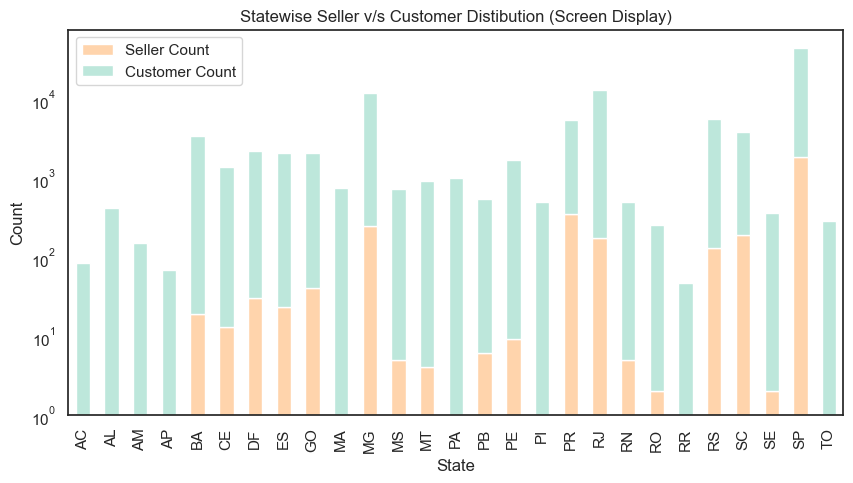

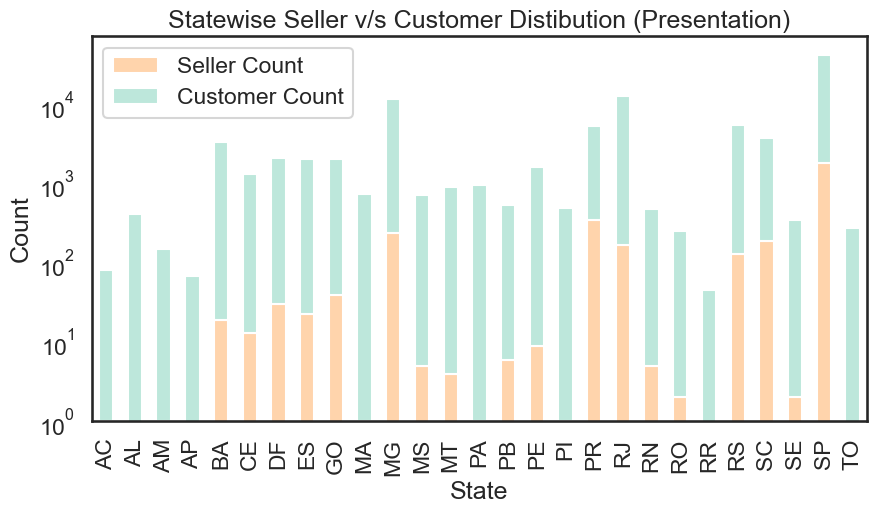

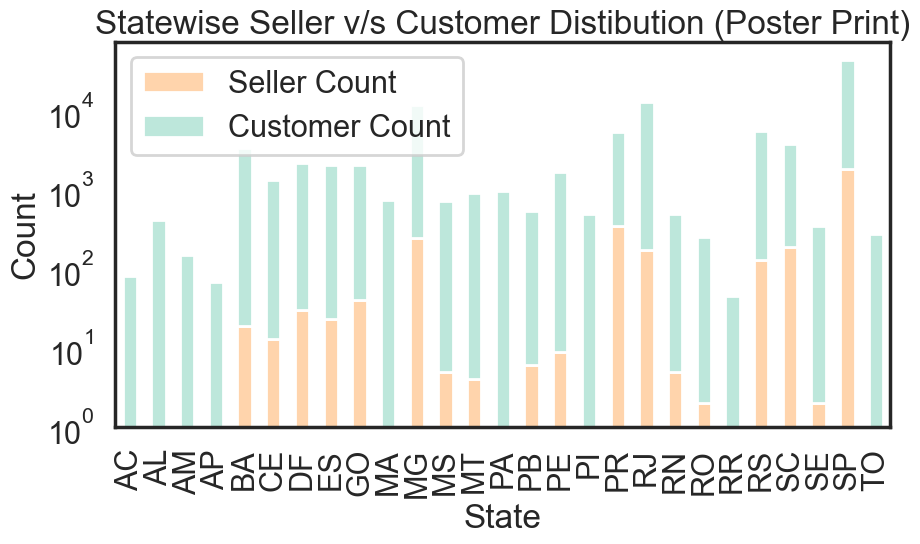

In [81]:
for each in range(len(contexts)):
    sns.set_context(contexts[each])
    fig, ax = plt.subplots(figsize=(10,5))
    scdf.plot(kind='bar', x='State', stacked=True, logy=True, ax=ax, cmap='icefire_r')
    plt.ylabel('Count')
    plt.title(f'Statewise Seller v/s Customer Distibution ({titlel[each]})')
    plt.show()
sns.set_context('notebook')

---